<h3>Code to compare FTLE maps</h3>

In [41]:
import numpy as np
import xarray as xr
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
from matplotlib import colors
from scipy import stats

In [42]:
year = 2017
mon_name = 'Dec'
home_folder = '/nethome/manra003/analysis/dispersion/'
output_folder = home_folder+ 'outputs/ftle/'
Td=15

In [43]:
coords = np.load(home_folder + 'Benguela_0625_401x257_release_points.npz')

model_mask_file = '/storage/shared/oceanparcels/input_data/NEMO16_CMCC/GLOB16L98_mesh_mask_atlantic.nc'

mask_ds = xr.open_dataset(model_mask_file, decode_times=False).load()
mask_lon = mask_ds['glamf'].values
mask_lat = mask_ds['gphif'].values
mask_land = mask_ds['tmask'].values[:,0,:,:]

In [44]:
def convert_ftle_dataset(FTLE_f, coords):
    
    coords0, coords1 = 401, 257

    x0 = np.reshape(coords['Longitude'], (coords0, coords1)) 
    y0 = np.reshape(coords['Latitude'], (coords0, coords1))
    f= np.reshape(FTLE_f, (coords0, coords1))

    modified_ds = xr.Dataset(

        data_vars=dict(

            FTLE_f=(["x", "y"], f)

        ),

        coords=dict(

            lon=(["x", "y"], x0),

            lat=(["x", "y"], y0)

        ),

        attrs=dict(description="FTLE field"),

    )
    return modified_ds

def crop_dataset(modified_ds):
    left_lon = 10
    right_lon = 20
    top_lat = -20
    bottom_lat = -35
    ds_cropped = modified_ds.where((modified_ds.lat>bottom_lat) & (modified_ds.lat<top_lat) & (modified_ds.lon>left_lon) & (modified_ds.lon<right_lon), drop=True)
    return ds_cropped

<h3>Load first FTLE output file. Example here: 2D simulation at 100 m

In [45]:
def plot_ftle(ds_cropped, asc_order, dim, mon_name, year, r_depth):
    custom_size=15
    fig = plt.figure(figsize=(8, 10), dpi=300)
    ax = plt.axes(projection=ccrs.PlateCarree())
    gl = ax.gridlines(draw_labels=True)
    gl.xlines = False
    gl.ylines = False
    gl.top_labels = False
    gl.right_labels = False
    gl.xlabel_style = {'size': custom_size, 'color': 'k'}
    gl.ylabel_style = {'size': custom_size, 'color': 'k'}
    ax.set_xlim(10, 20)
    ax.set_ylim(-35, -20)
    # ax.set_xlim(3, 21)
    # ax.set_ylim(-42, -12)
    colormap = colors.ListedColormap(['gainsboro', 'white'])
    min_limit = -0.14
    max_limit = 0.3
    divnorm = colors.TwoSlopeNorm(vmin=min_limit, vcenter=0, vmax=max_limit)

    ax.pcolormesh(mask_lon[0, 1249:1750, 1499:], mask_lat[0, 1249:1750, 1499:], mask_land[0, 1250:1750, 1500:], cmap=colormap)
    plt.scatter(ds_cropped['lon'], ds_cropped['lat'], c=ds_cropped['FTLE_f'], cmap='magma', s=3, norm=divnorm)
    ftle_min, ftle_max = np.round(np.nanmin(ds_cropped['FTLE_f']),2), np.round(np.nanmax(ds_cropped['FTLE_f']),2)
    plt.title('{6} {5} FLTE computation for {0} {1} after {4} days of release \nMinimum: {2} and Maximum: {3}\n'.format(mon_name, year, ftle_min, ftle_max, Td, dim, asc_order), fontsize=custom_size)
    cbar = plt.colorbar()
    cbar.set_label(label='FTLE (1/days)', size=custom_size)
    cbar.ax.tick_params(labelsize=custom_size)
    plt.clim(0, 0.3)

    plt.savefig(output_folder + 'plots/{0}_{1}_FTLE_Benguela_0625_401x257_{2}01-31_{3}_{4}z.jpeg'.format(asc_order, dim, mon_name, year, r_depth), bbox_inches='tight',
        pad_inches=0.2)


In [46]:
asc_order ='Bkwd'
dim ='2D'
r_depth = 100 

ds1 = np.load(output_folder + '{0}_{1}_FTLE_Benguela_0625_401x257_{2}01-31_{3}_{4}z.npz'.format(asc_order, dim, mon_name, year, r_depth))
temp_ftle = ds1['FTLE_f']
print(np.nanmin(temp_ftle), np.nanmax(temp_ftle))
ds_1 = convert_ftle_dataset(temp_ftle, coords)
cropped_ds_1 = crop_dataset(ds_1)
FTLE_1=cropped_ds_1['FTLE_f']


-0.05301720779522227 0.3311489814975773


DescribeResult(nobs=22450, minmax=(masked_array(data=0.02798049,
             mask=False,
       fill_value=1e+20), masked_array(data=0.29152784,
             mask=False,
       fill_value=1e+20)), mean=0.11141357641013339, variance=0.0023136153704710312, skewness=masked_array(data=0.81465984,
             mask=False,
       fill_value=1e+20), kurtosis=0.06524832680052972)

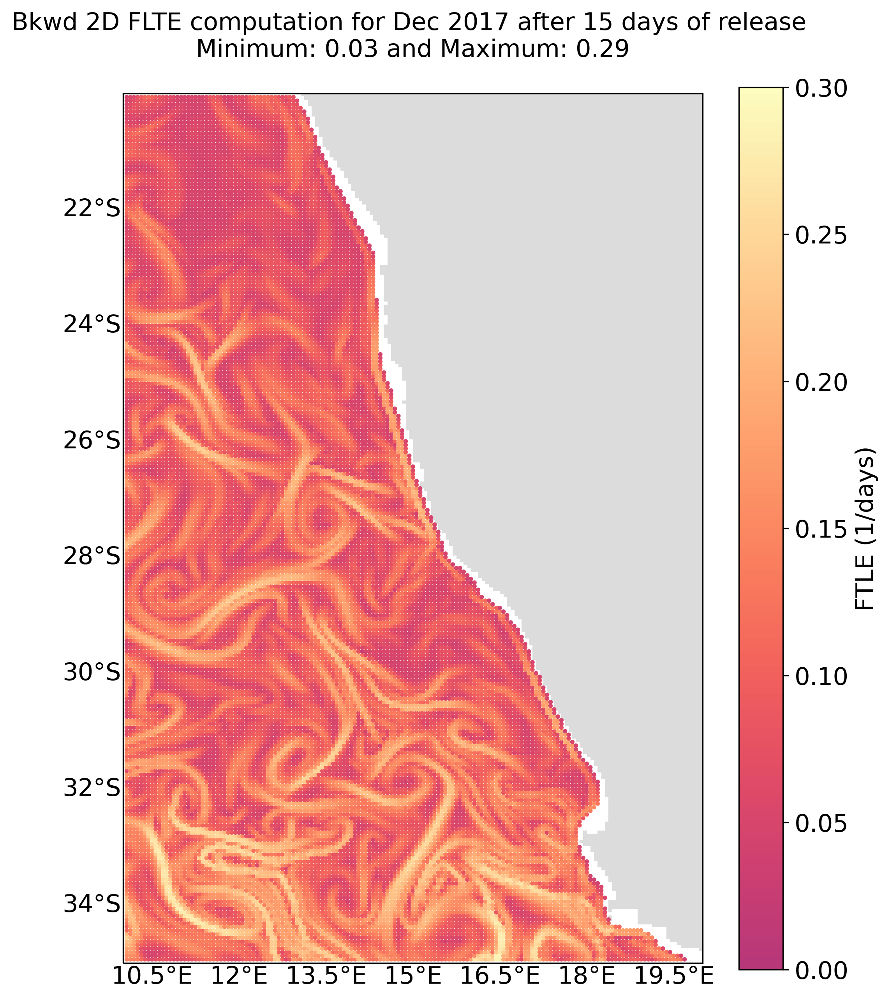

In [47]:
plot_ftle(cropped_ds_1, asc_order, dim, mon_name, year, r_depth)
stats.describe(cropped_ds_1['FTLE_f'][:], axis= None, nan_policy='omit')

/nethome/manra003/.conda/envs/dispersion/lib/python3.8/site-packages/matplotlib/axes/_axes.py:6731: RuntimeWarning: All-NaN slice encountered
  xmin = min(xmin, np.nanmin(xi))
/nethome/manra003/.conda/envs/dispersion/lib/python3.8/site-packages/matplotlib/axes/_axes.py:6732: RuntimeWarning: All-NaN slice encountered
  xmax = max(xmax, np.nanmax(xi))


(array([[12., 62., 51., ...,  5.,  1.,  0.],
        [ 5., 55., 66., ...,  6.,  0.,  0.],
        [ 2., 55., 60., ...,  1.,  0.,  0.],
        ...,
        [ 0.,  0.,  0., ...,  0.,  0.,  0.],
        [ 0.,  0.,  0., ...,  0.,  0.,  0.],
        [ 0.,  0.,  0., ...,  0.,  0.,  0.]]),
 array([0.02798049, 0.05433523, 0.08068996, 0.1070447 , 0.13339943,
        0.15975417, 0.1861089 , 0.21246363, 0.23881837, 0.2651731 ,
        0.29152784]),
 <a list of 159 BarContainer objects>)

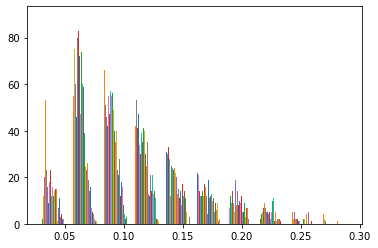

In [48]:
plt.hist(cropped_ds_1['FTLE_f'])


<h3> Load second FTLE data. Example: Backward 3D at 100m depth 

-0.03935730635354278 0.3357847448267154


DescribeResult(nobs=22450, minmax=(masked_array(data=0.02798049,
             mask=False,
       fill_value=1e+20), masked_array(data=0.29250912,
             mask=False,
       fill_value=1e+20)), mean=0.1113179874219669, variance=0.002304488239722836, skewness=masked_array(data=0.81340702,
             mask=False,
       fill_value=1e+20), kurtosis=0.06497187651791503)

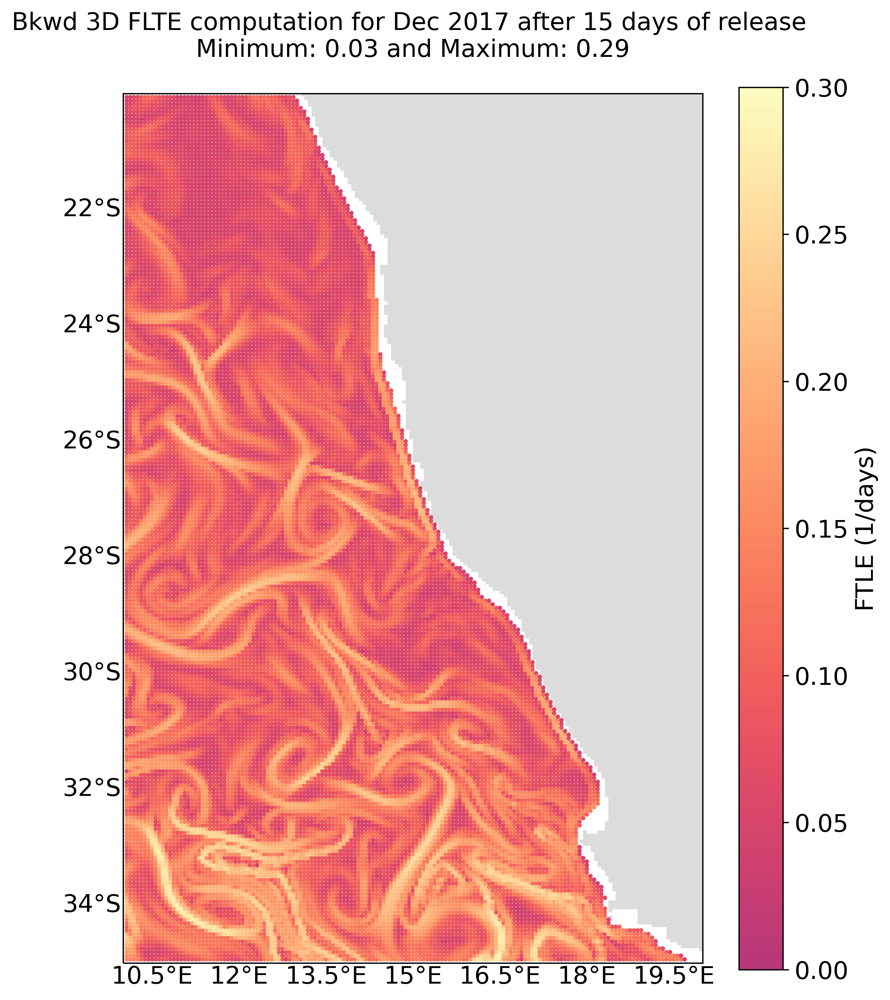

In [49]:
asc_order ='Bkwd'
dim ='3D'
r_depth = 100 

ds2 = np.load(output_folder + '{0}_{1}_FTLE_Benguela_0625_401x257_{2}01-31_{3}_{4}z.npz'.format(asc_order, dim, mon_name, year, r_depth))
temp_ftle = ds2['FTLE_f']
print(np.nanmin(temp_ftle), np.nanmax(temp_ftle))
ds_2 = convert_ftle_dataset(temp_ftle, coords)
cropped_ds_2 = crop_dataset(ds_2)
plot_ftle(cropped_ds_2, asc_order, dim, mon_name, year, r_depth)
stats.describe(cropped_ds_2['FTLE_f'], axis= None, nan_policy='omit')

-0.13512504236762926 0.3561145578338105


DescribeResult(nobs=22450, minmax=(masked_array(data=-0.13512504,
             mask=False,
       fill_value=1e+20), masked_array(data=0.29962083,
             mask=False,
       fill_value=1e+20)), mean=0.10923725215285487, variance=0.0025627395609723806, skewness=masked_array(data=0.85980854,
             mask=False,
       fill_value=1e+20), kurtosis=0.13476172729216707)

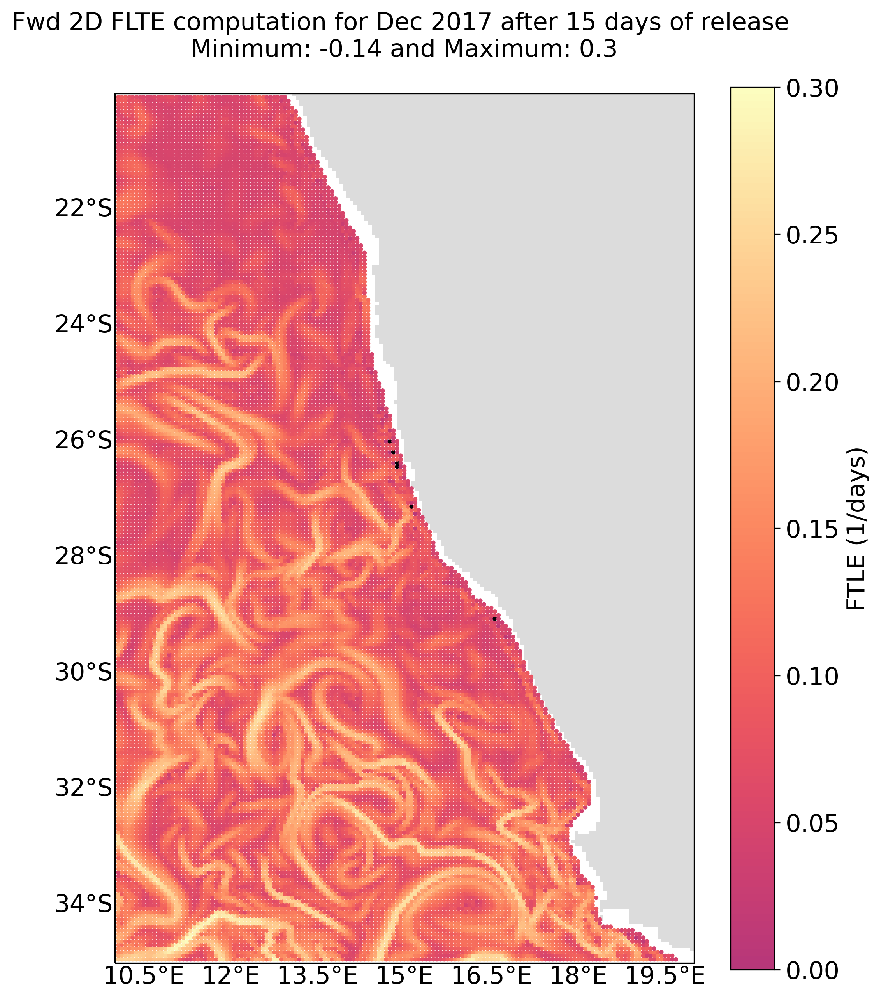

In [50]:
asc_order ='Fwd'
dim ='2D'
r_depth = 100 

ds3 = np.load(output_folder + '{0}_{1}_FTLE_Benguela_0625_401x257_{2}01-31_{3}_{4}z.npz'.format(asc_order, dim, mon_name, year, r_depth))
temp_ftle = ds3['FTLE_f']
print(np.nanmin(temp_ftle), np.nanmax(temp_ftle))
ds_3 = convert_ftle_dataset(temp_ftle, coords)
cropped_ds_3 = crop_dataset(ds_3)
plot_ftle(cropped_ds_3, asc_order, dim, mon_name, year, r_depth)
stats.describe(cropped_ds_3['FTLE_f'], axis= None, nan_policy='omit')

-0.02999777288708439 0.3561388928262856


DescribeResult(nobs=22450, minmax=(masked_array(data=0.0007894,
             mask=False,
       fill_value=1e+20), masked_array(data=0.29984867,
             mask=False,
       fill_value=1e+20)), mean=0.11017677057002351, variance=0.0025448149082880735, skewness=masked_array(data=0.83229188,
             mask=False,
       fill_value=1e+20), kurtosis=0.010115032961491632)

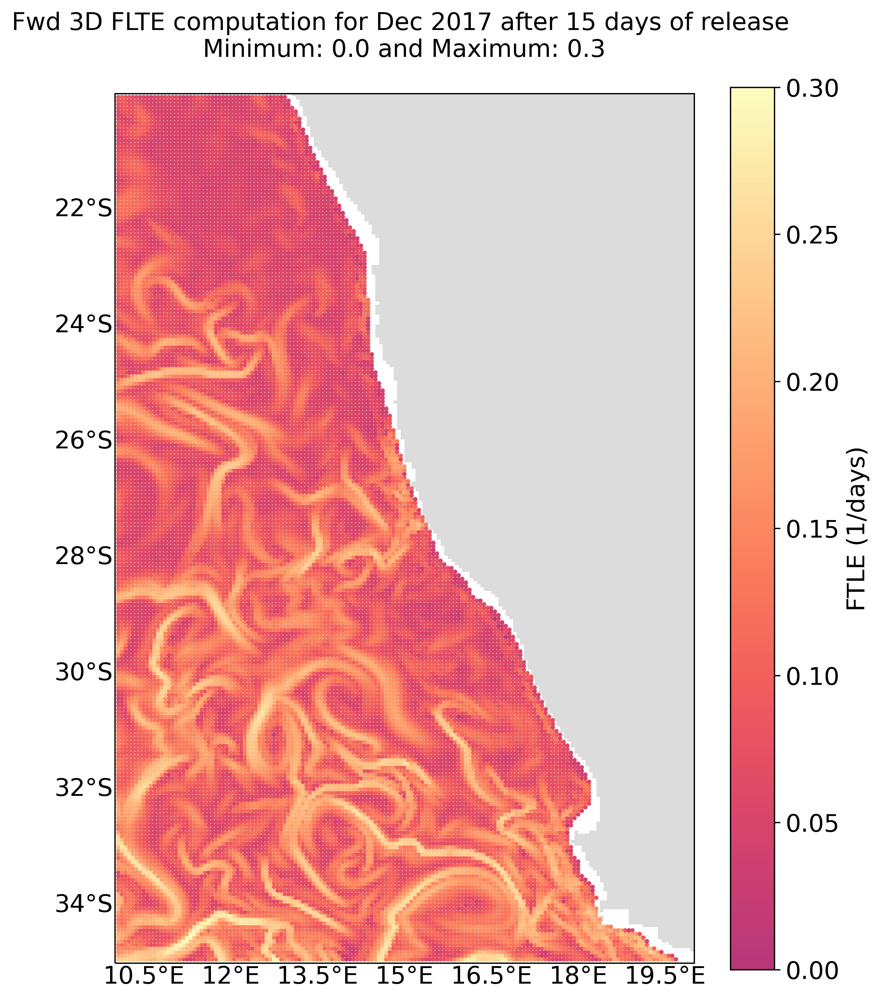

In [51]:
asc_order ='Fwd'
dim ='3D'
r_depth = 100 

ds4 = np.load(output_folder + '{0}_{1}_FTLE_Benguela_0625_401x257_{2}01-31_{3}_{4}z.npz'.format(asc_order, dim, mon_name, year, r_depth))
temp_ftle = ds4['FTLE_f']
print(np.nanmin(temp_ftle), np.nanmax(temp_ftle))
ds_4 = convert_ftle_dataset(temp_ftle, coords)
cropped_ds_4 = crop_dataset(ds_4)
plot_ftle(cropped_ds_4, asc_order, dim, mon_name, year, r_depth)
stats.describe(cropped_ds_4['FTLE_f'], axis= None, nan_policy='omit')

In [52]:
# 1: 0.02798049,0.29152784
# 2: 0.02798049, 0.29250912
# 3: -0.13512504, 0.29962083
# 4: 0.0007894,0.29984867

In [53]:
def plot_diff(diff, ds_cropped, dim, asc_order):
    custom_size=15
    fig = plt.figure(figsize=(8, 10), dpi=300)
    ax = plt.axes(projection=ccrs.PlateCarree())
    gl = ax.gridlines(draw_labels=True)
    gl.xlines = False
    gl.ylines = False
    gl.top_labels = False
    gl.right_labels = False
    gl.xlabel_style = {'size': custom_size, 'color': 'k'}
    gl.ylabel_style = {'size': custom_size, 'color': 'k'}
    ax.set_xlim(10, 20)
    ax.set_ylim(-35, -20)
    # ax.set_xlim(3, 21)
    # ax.set_ylim(-42, -12)
    colormap = colors.ListedColormap(['gainsboro', 'white'])
    # min_limit = -0.14
    # max_limit = 0.13
    min_limit, max_limit = np.nanmin(diff), np.nanmax(diff)
    divnorm = colors.SymLogNorm(linthresh=0.03,vmin=min_limit,  vmax=max_limit)

    ax.pcolormesh(mask_lon[0, 1249:1750, 1499:], mask_lat[0, 1249:1750, 1499:], mask_land[0, 1250:1750, 1500:], cmap=colormap)
    plt.scatter(ds_cropped['lon'], ds_cropped['lat'], c=diff, cmap='RdBu_r', s=3, norm=divnorm)
    ftle_min, ftle_max = np.round(np.nanmin(diff),2), np.round(np.nanmax(diff),2)
    plt.title('{6} {5} FLTE computation for {0} {1} after {4} days of release\n\n Minimum: {2} and Maximum: {3}'.format(mon_name, year, ftle_min, ftle_max, Td, dim, asc_order), fontsize=custom_size)
    cbar = plt.colorbar()
    cbar.set_label(label='FTLE (1/days)', size=custom_size)
    cbar.ax.tick_params(labelsize=custom_size)
    plt.clim(-0.2, 0.2)

    plt.savefig(output_folder + 'plots/Diff_{0}_{1}_FTLE_Benguela_0625_401x257_{2}01-31_{3}_{4}z.jpeg'.format(asc_order, dim, mon_name, year, r_depth), bbox_inches='tight',
        pad_inches=0.2)


-0.13506020515629946 0.12311242720207849


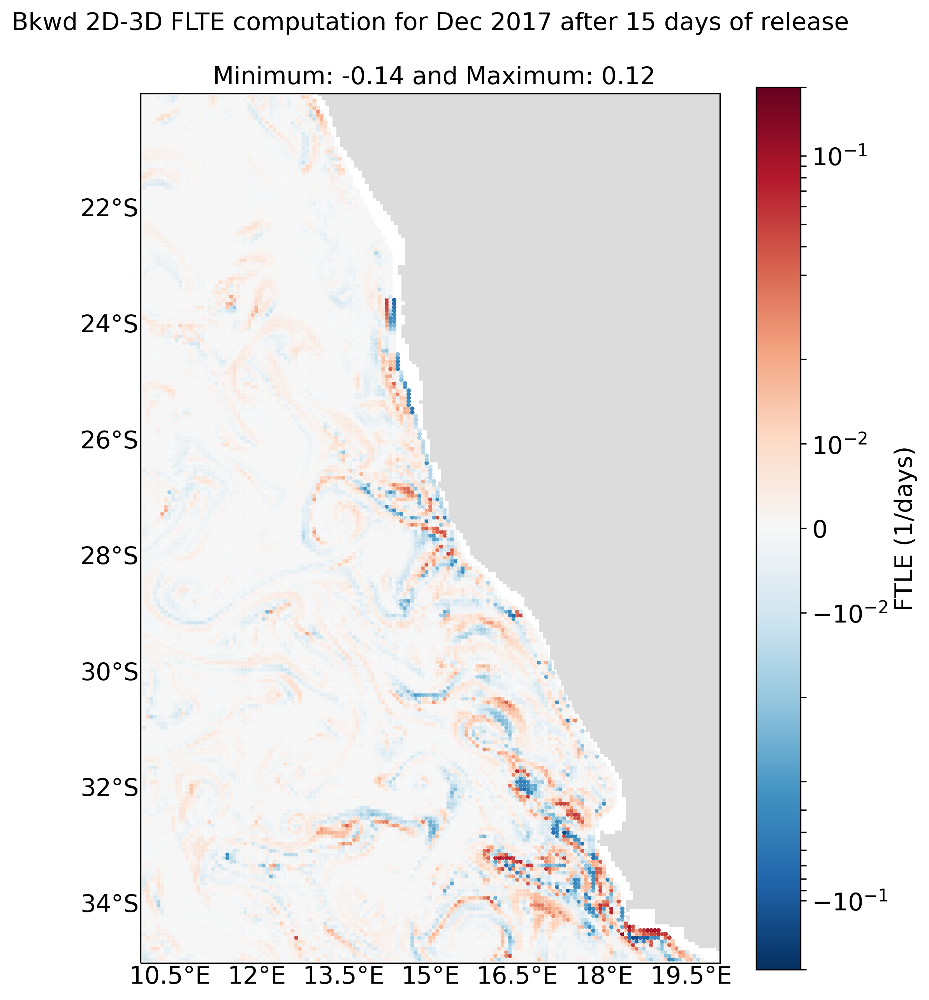

In [54]:
diff_bkwd = cropped_ds_1['FTLE_f'] - cropped_ds_2['FTLE_f']
print(np.nanmin(diff_bkwd), np.nanmax(diff_bkwd))
plot_diff(diff_bkwd, cropped_ds_1, "2D-3D", 'Bkwd')

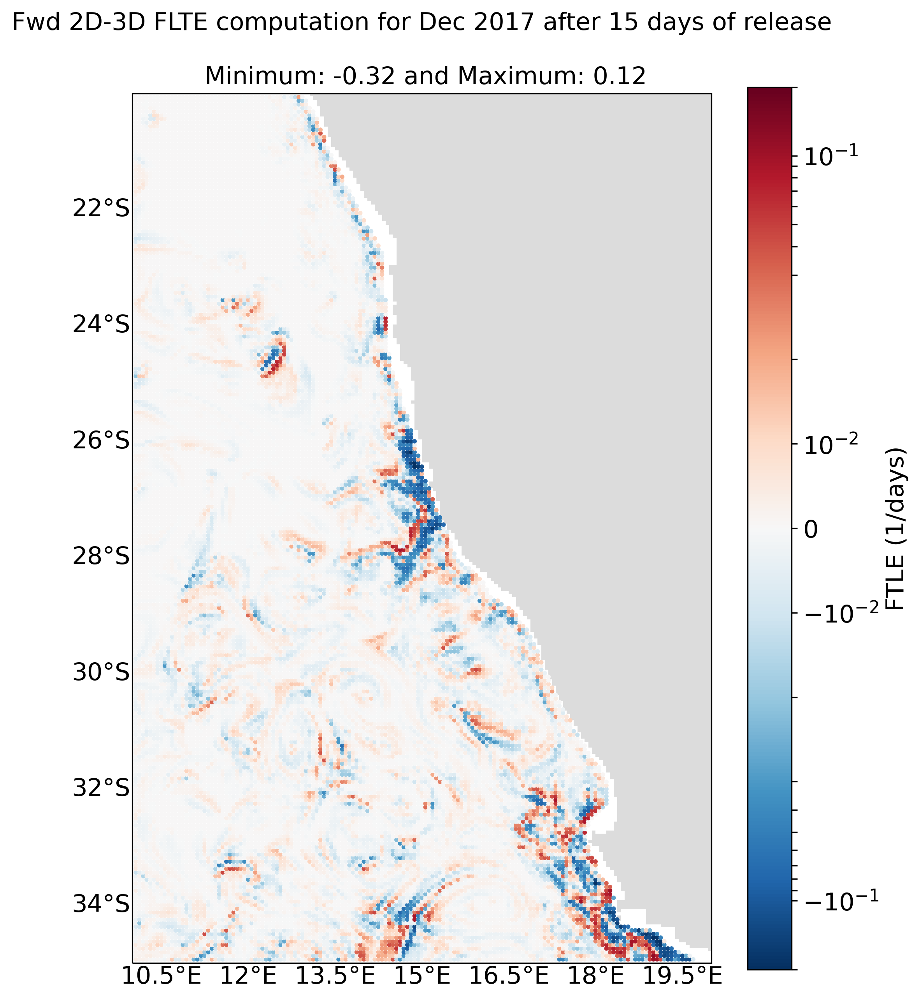

In [55]:
diff_fwd = cropped_ds_3['FTLE_f'] - cropped_ds_4['FTLE_f']
np.nanmin(diff_fwd), np.nanmax(diff_fwd)
plot_diff(diff_fwd, cropped_ds_1, "2D-3D", 'Fwd')


<h2> Surface simulations- 2D only

-0.01957336271077043 0.35844751814097575


DescribeResult(nobs=23442, minmax=(masked_array(data=0.03330099,
             mask=False,
       fill_value=1e+20), masked_array(data=0.31935187,
             mask=False,
       fill_value=1e+20)), mean=0.10738380055530648, variance=0.0026757725031052067, skewness=masked_array(data=1.07291713,
             mask=False,
       fill_value=1e+20), kurtosis=0.5050220567152297)

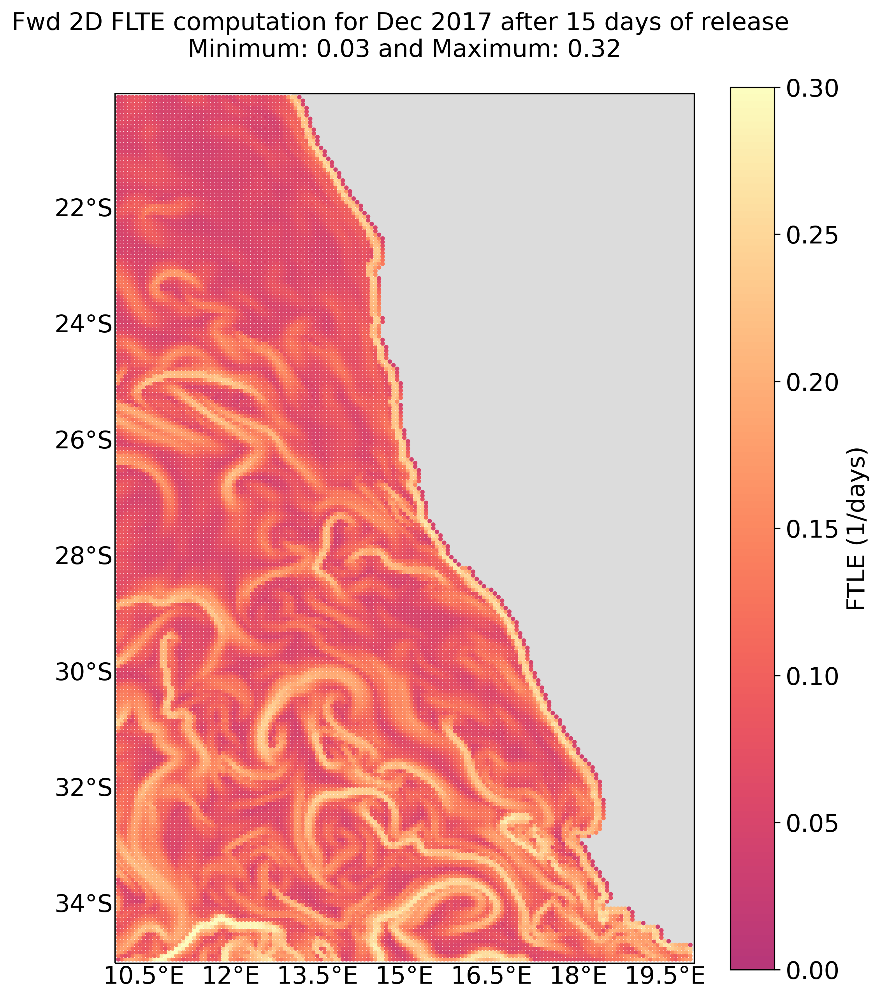

In [56]:
asc_order ='Fwd'
dim ='2D'
r_depth = 0 

ds5 = np.load(output_folder + '{0}_{1}_FTLE_Benguela_0625_401x257_{2}01-31_{3}_{4}z.npz'.format(asc_order, dim, mon_name, year, r_depth))
temp_ftle = ds5['FTLE_f']
print(np.nanmin(temp_ftle), np.nanmax(temp_ftle))
ds_5 = convert_ftle_dataset(temp_ftle, coords)
cropped_ds_5 = crop_dataset(ds_5)
plot_ftle(cropped_ds_5, asc_order, dim, mon_name, year, r_depth)
stats.describe(cropped_ds_5['FTLE_f'], axis= None, nan_policy='omit')

-0.1168621134015251 0.32973557986186874


DescribeResult(nobs=23370, minmax=(masked_array(data=-0.03867361,
             mask=False,
       fill_value=1e+20), masked_array(data=0.30381135,
             mask=False,
       fill_value=1e+20)), mean=0.1054536532224497, variance=0.0026510367612269732, skewness=masked_array(data=0.89361136,
             mask=False,
       fill_value=1e+20), kurtosis=0.16047312447459738)

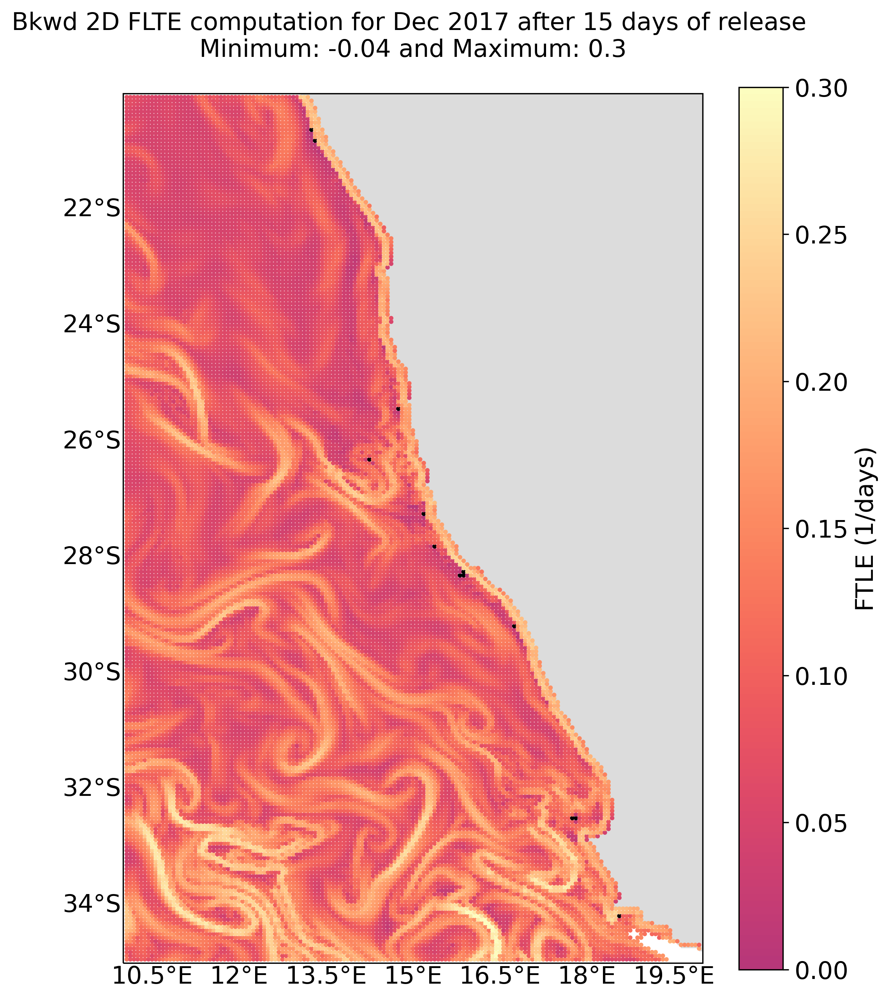

In [57]:
asc_order ='Bkwd'
dim ='2D'
r_depth = 0 

ds6 = np.load(output_folder + '{0}_{1}_FTLE_Benguela_0625_401x257_{2}01-31_{3}_{4}z.npz'.format(asc_order, dim, mon_name, year, r_depth))
temp_ftle = ds6['FTLE_f']
print(np.nanmin(temp_ftle), np.nanmax(temp_ftle))
ds_6 = convert_ftle_dataset(temp_ftle, coords)
cropped_ds_6 = crop_dataset(ds_6)
plot_ftle(cropped_ds_6, asc_order, dim, mon_name, year, r_depth)
stats.describe(cropped_ds_6['FTLE_f'], axis= None, nan_policy='omit')

-0.2083276647674504 0.2491713379579214


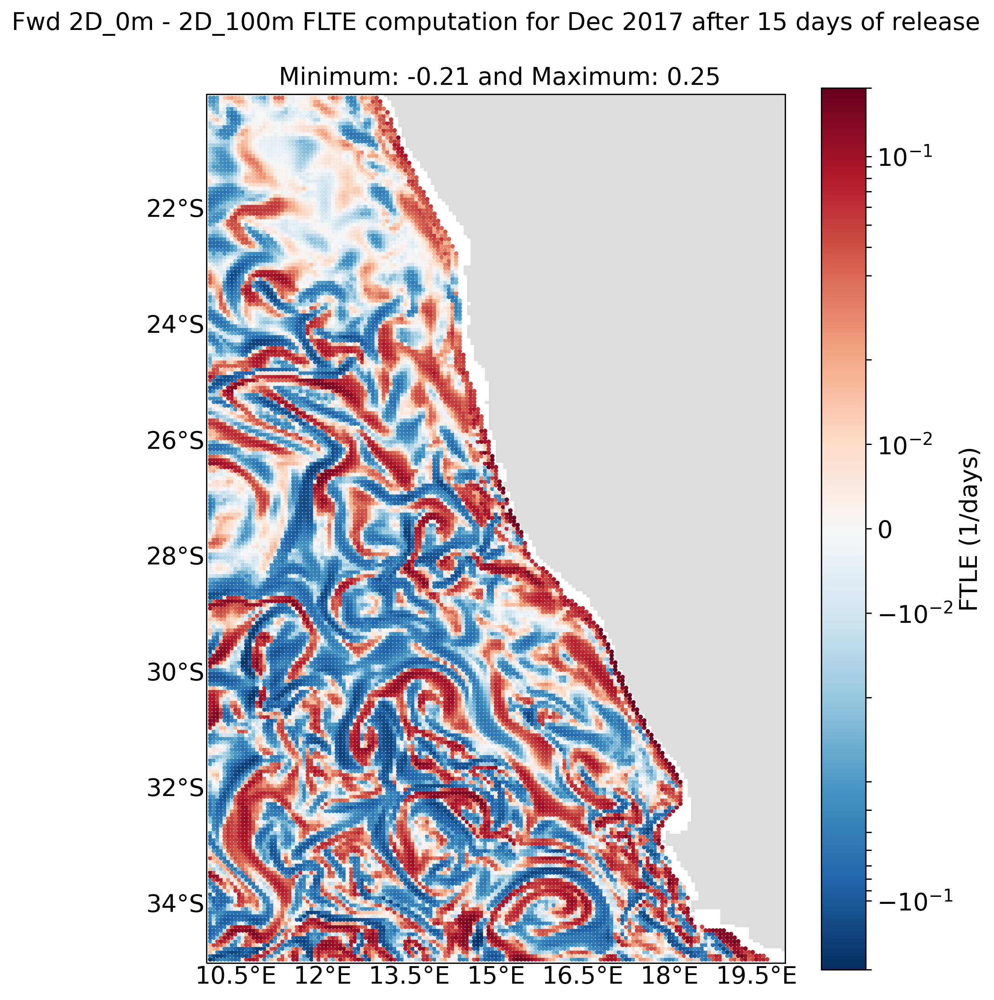

In [58]:
diff_fwd = cropped_ds_5['FTLE_f'] - cropped_ds_3['FTLE_f']
print(np.nanmin(diff_fwd), np.nanmax(diff_fwd))
plot_diff(diff_fwd, cropped_ds_1, "2D_0m - 2D_100m", 'Fwd')


-0.24647397425296363 0.1983924627618235


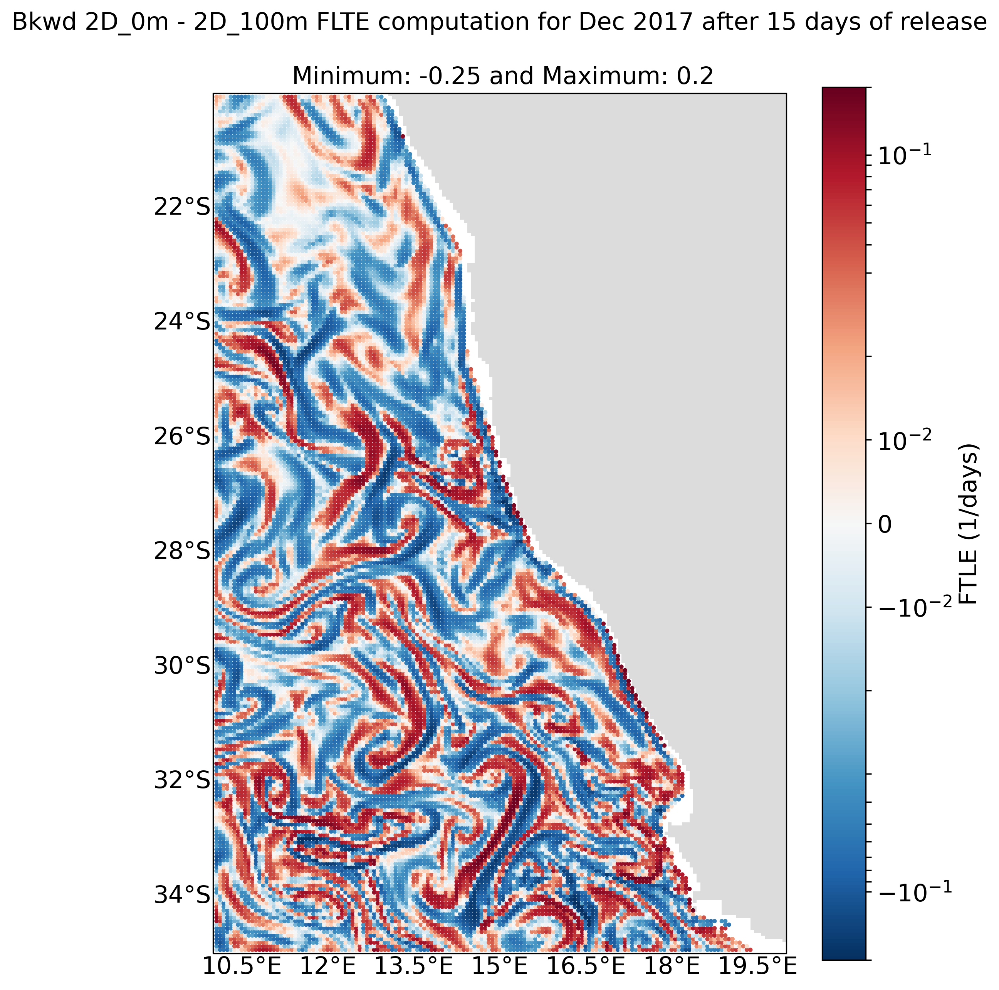

In [59]:
diff_bkwd = cropped_ds_6['FTLE_f'] - cropped_ds_1['FTLE_f']
print(np.nanmin(diff_bkwd), np.nanmax(diff_bkwd))
plot_diff(diff_bkwd, cropped_ds_1, "2D_0m - 2D_100m", 'Bkwd')

In [60]:
# Add correlation